# <center>*Gap Option*</center>

A binary option is a type of financial derivative where the payoff depends on whether the underlying asset's price at maturity is above or below a predetermined strike price. Specifically, a binary call option pays out a fixed amount if the price of the underlying asset at maturity is above the strike price, while a binary put option pays out a fixed amount if the price of the underlying asset at maturity is below the strike price. If the price of the underlying asset is at or near the strike price at maturity, the option may expire worthless.

The formula for the payout of a binary call option is:

$$
C_{binary} =
\begin{cases}
1 & \text{if } S_T > K \\
0 & \text{otherwise}
\end{cases}
$$

where $S_T$ is the price of the underlying asset at maturity and $K$ is the strike price.

The formula for the payout of a binary put option is:

$$
P_{binary} =
\begin{cases}
1 & \text{if } S_T < K \\
0 & \text{otherwise}
\end{cases}
$$

where the variables have the same meaning as in the binary call option formula.

**Binary Option Pricing Formulae**

The pricing of binary options can also be calculated using numerical methods, such as Monte Carlo simulations, or analytic methods, such as the Black-Scholes model with a modification to account for the binary nature of the option.

The formula for pricing a binary call option using the Black-Scholes model is:

$$
C_{binary} = Q e^{-rT} \Phi(d_2)
$$

where $r$ is the risk-free interest rate, $T$ is the time to maturity, $d_2$ is defined as:

$$
d_2 = \frac{\ln(S_0/K) + (r - \sigma^2/2)T}{\sigma\sqrt{T}}
$$

and $\Phi(\cdot)$ is the cumulative distribution function of the standard normal distribution.

The formula for pricing a binary put option is:

$$
P_{binary} = Q e^{-rT} \Phi(-d_2)
$$

where $P_{binary}$ is the price of the binary put option and the other variables have the same meanings as in the binary call option formula.

Note that the Black-Scholes model assumptions and limitations discussed for the gap option also apply to binary options. Additionally, binary options may be subject to certain regulatory requirements and are not available in all jurisdictions.I will now prove the pricing formulae for the binary option:-

$$ P = Q e^{-rT}N(d_2) $$

To derive this formula, we first note that the option has a fixed payoff, which means that the value of the option depends only on the probability of it expiring in the money. Using the risk-neutral valuation principle, we can assume that the expected payoff of the option is equal to its present value.

Therefore, we can write:

$$ P = e^{-rT}E[Q] $$

To calculate $E[Q]$, we use the Black-Scholes model to derive the distribution of $S_T$. Since the payoff of the option is a step function, we only need to consider the probability of $S_T$ being greater than or equal to $K$.

Using the Black-Scholes model, we can derive the following expression for the probability that $S_T$ is greater than or equal to $K$:

$$ N(d_2) = P(S_T >= K) $$

where $d_2$ is the standard normal distribution variable defined above.

Substituting this expression into the equation for the expected payoff, we get:

$$ P = e^{-rT}E[Q] $$
$$ = Q e^{-rT}[1*P(S_T >= K) + 0*P(S_T < K)] $$
$$ = Q e^{-rT}P(S_T >= K) $$
$$ = Q e^{-rT}N(d_2) $$

which is the formula for pricing a binary option with strike $K$ and payoff $Q$. 
Below is the sensitivity analysis of Binary Option along with all the relevant plots:-


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use("fivethirtyeight")
from scipy.stats import norm

In [2]:
def BinaryOptionCall(t, T, sigma, r, St, K, Q):
    d1=(np.log(St/K)+(r+(sigma*sigma)/2)*(T-t))/(sigma*np.sqrt(T-t))
    d2=d1-sigma*np.sqrt(T-t)
    return Q*np.exp(-r*(T-t))*norm.cdf(d2)

def BinaryOptionPut(t, T, sigma, r, St, K, Q):
    d1=(np.log(St/K)+(r+(sigma*sigma)/2)*(T-t))/(sigma*np.sqrt(T-t))
    d2=d1-sigma*np.sqrt(T-t)
    return Q*np.exp(-r*(T-t))*norm.cdf(-d2)

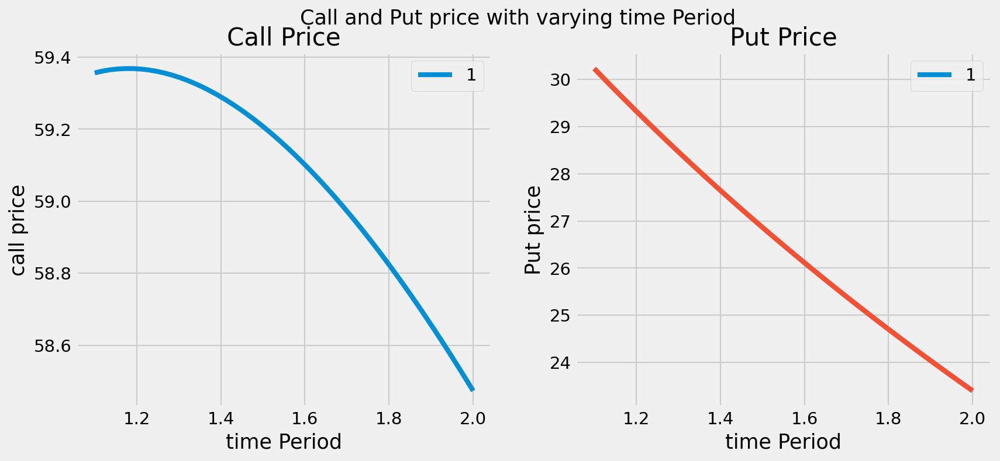

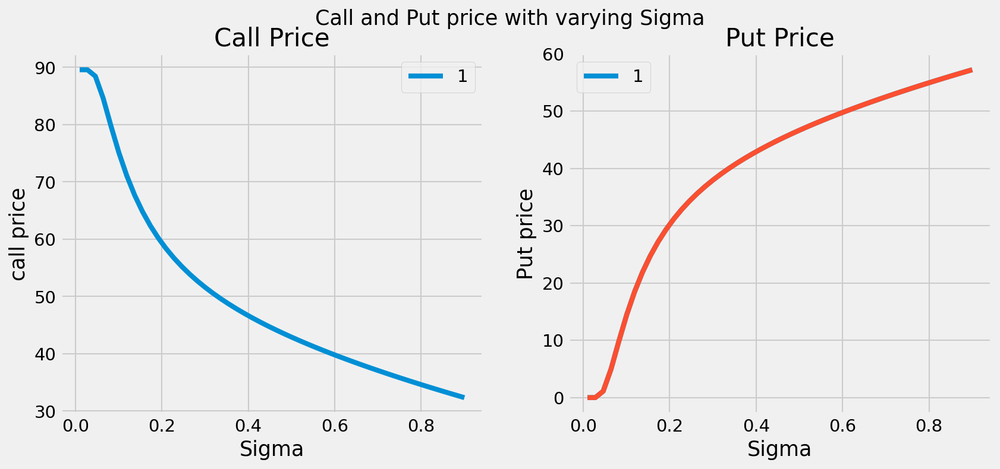

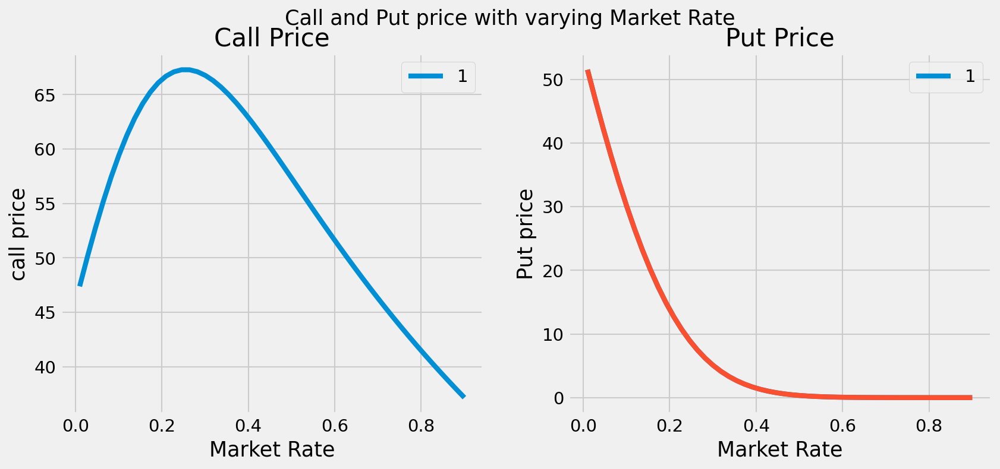

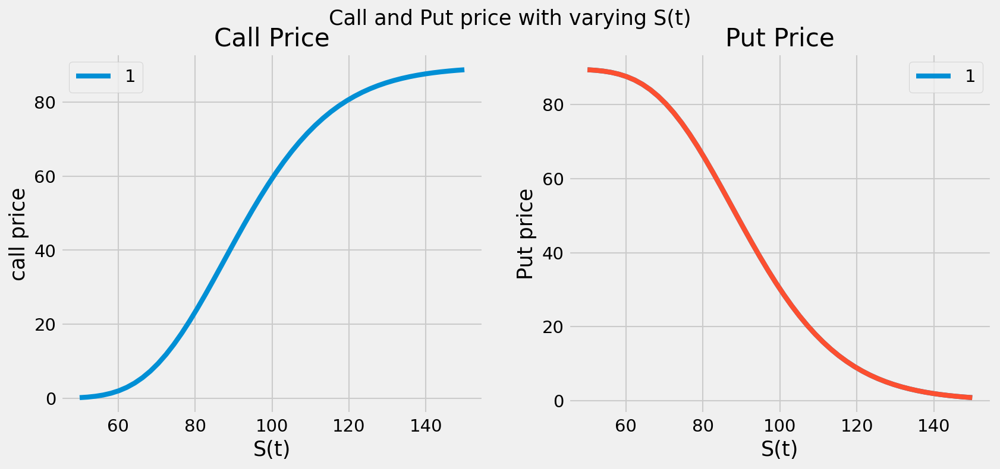

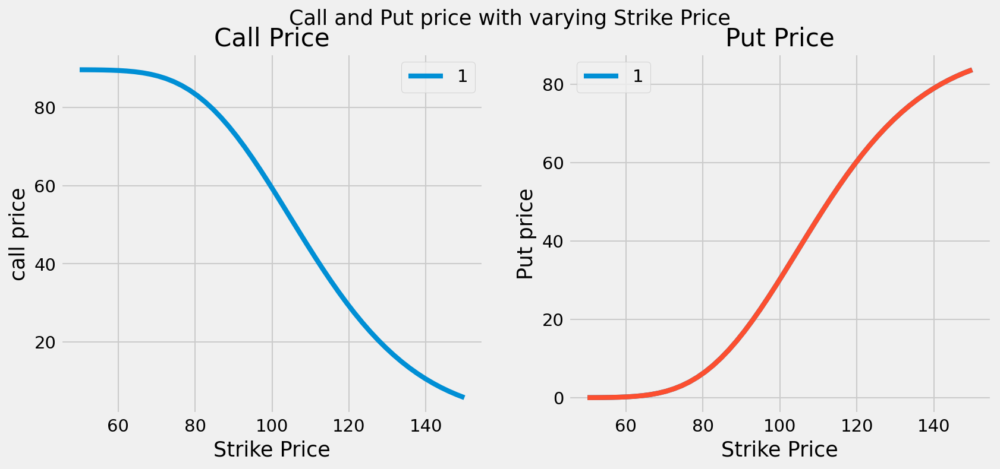

...

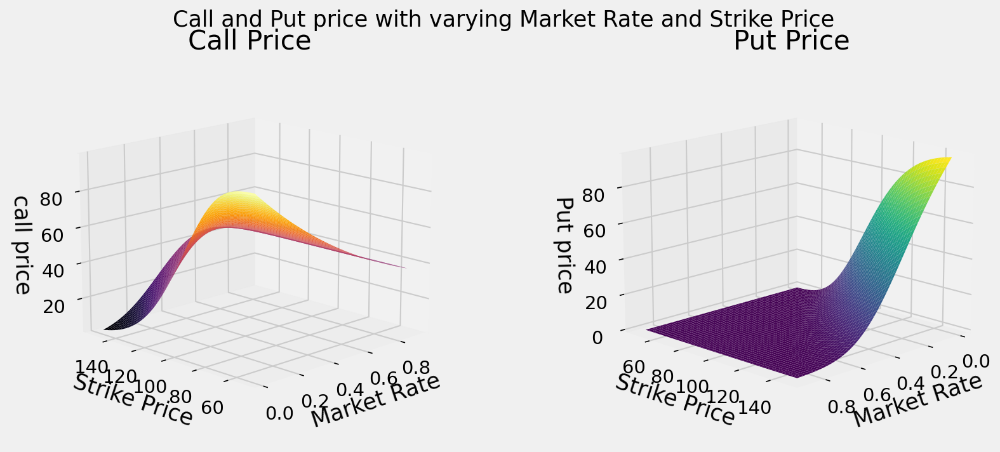

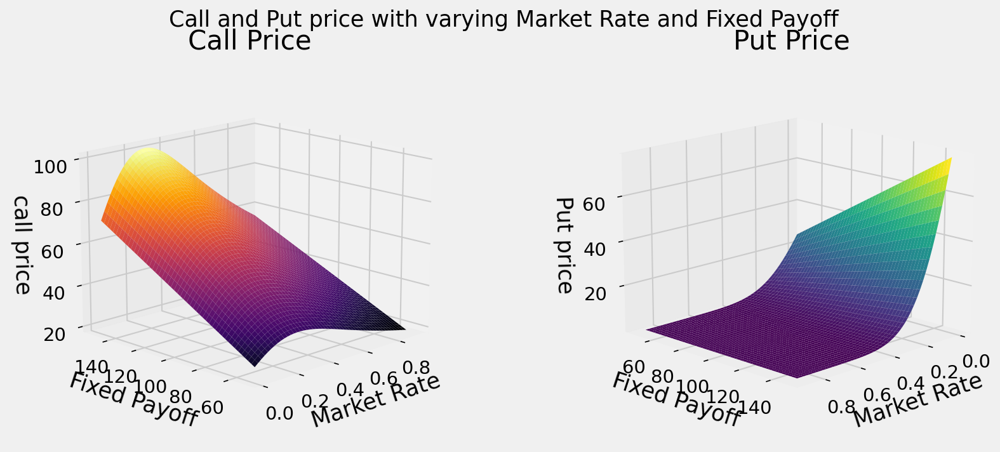

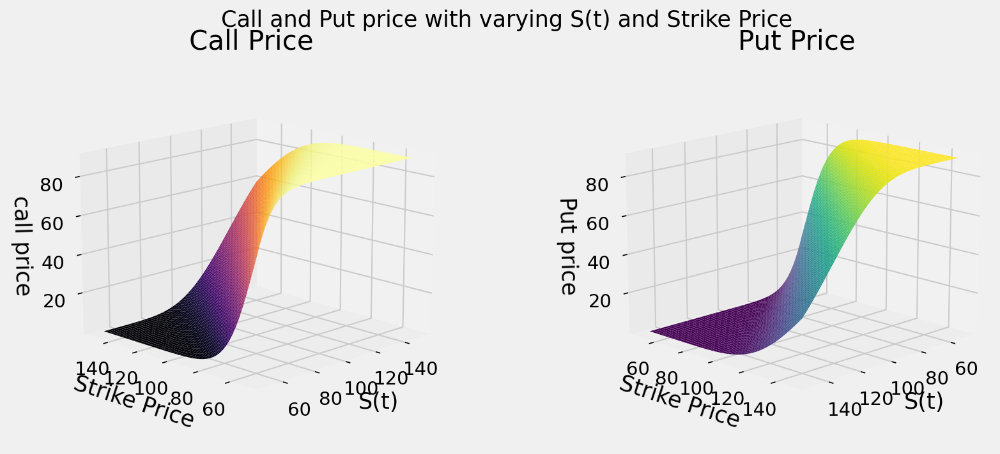

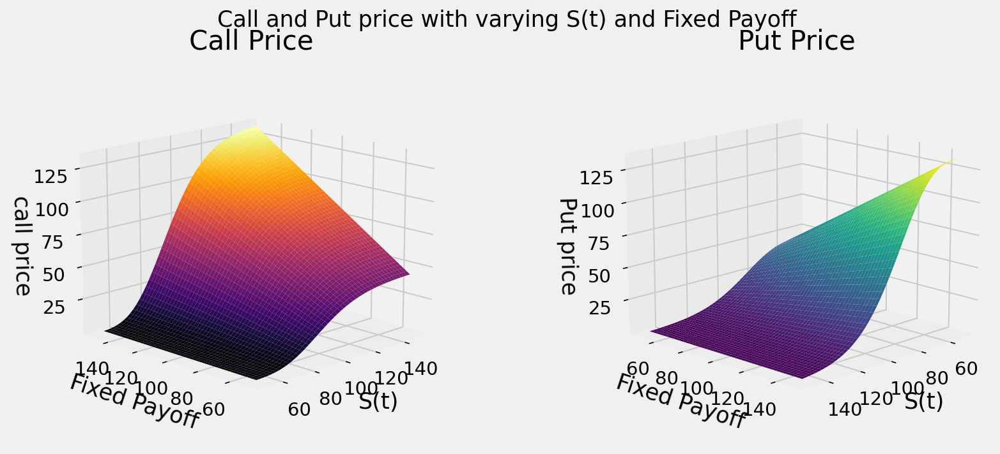

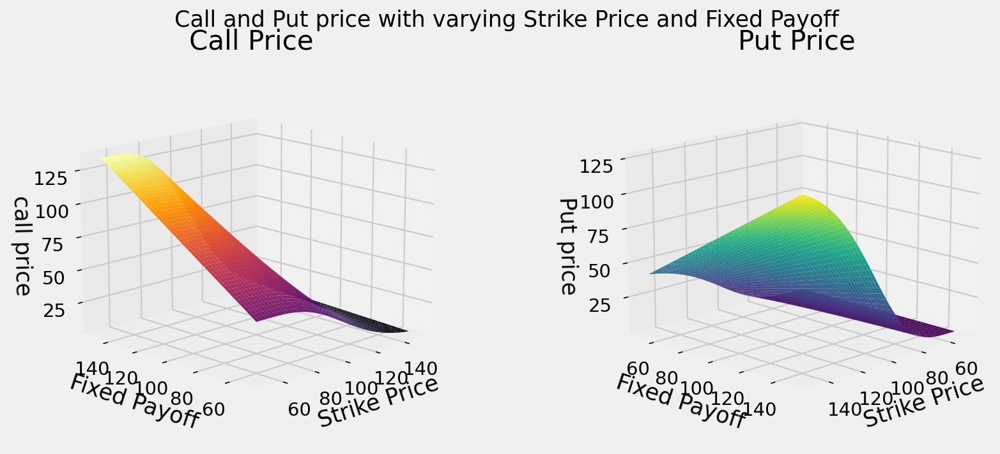

In [3]:
# def optionPrice(t, T, sigma, r, St, K, Q):
varying = []
varying.append(np.linspace(0,1,50))
varying.append(np.linspace(1.1,2,50))
varying.append(np.linspace(0.01,0.90,50))
varying.append(np.linspace(0.01,0.90,50))
varying.append(np.linspace(50,150,50))
varying.append(np.linspace(50,150,50))
varying.append(np.linspace(50,150,50))

names = ["start time", "time Period", "Sigma", "Market Rate", "S(t)", "Strike Price", "Fixed Payoff"]
for i in range(1,6):
    fig, ax = plt.subplots(nrows = 1,ncols = 2)
    for st in [1]:
        call_p = []
        put_p = []
        params = [0, 1.1, 0.2, 0.1, 100, 100, 100]
        for ii in range(len(varying[i])):
            params[i]=varying[i][ii]
            call_p.append(BinaryOptionCall(params[0],params[1],params[2],params[3],params[4],params[5],params[6]))
            put_p.append(BinaryOptionPut(params[0],params[1],params[2],params[3],params[4],params[5],params[6]))
            fig.suptitle("Call and Put price with varying "+names[i])
        ax[0].plot(varying[i],call_p)
        ax[1].plot(varying[i],put_p)
    fig.set_size_inches(12, 5)
    fig.set_dpi(150)
    ax[0].set_title("Call Price")
    ax[0].set_xlabel(names[i])
    ax[0].set_ylabel("call price")
    ax[1].plot(varying[i],put_p)
    ax[1].set_title("Put Price")
    ax[1].set_xlabel(names[i])
    ax[1].set_ylabel("Put price")
    ax[0].legend([1])
    ax[1].legend([1])
    plt.show()

for i in range(7):
    for j in range(i+1,7):
        fig, ax = plt.subplots(nrows = 1,ncols = 2,subplot_kw={"projection": "3d"})
        call_p = np.zeros((50,50))
        put_p = np.zeros((50,50))
        p_axis, q_axis = np.meshgrid(varying[i],varying[j])
        params = [0, 1.1, 0.2, 0.1, 100, 100, 100]
        for ii in range(len(p_axis)):
            for jj in range(len(q_axis)):
                params[i]=varying[i][ii]
                params[j]=varying[j][jj]
                call_p[ii][jj]=BinaryOptionCall(params[0],params[1],params[2],params[3],params[4],params[5],params[6])
                put_p[ii][jj]=BinaryOptionPut(params[0],params[1],params[2],params[3],params[4],params[5],params[6])
        call_p=call_p.T
        put_p=put_p.T
        fig.suptitle("Call and Put price with varying "+names[i]+" and "+names[j])
        fig.set_size_inches(12, 5)
        fig.set_dpi(150)
        ax[0].plot_surface(p_axis,q_axis,call_p,cmap='inferno')
        ax[0].set_title("Call Price")
        ax[0].set_xlabel(names[i])
        ax[0].set_ylabel(names[j])
        ax[0].set_zlabel("call price")
        ax[1].plot_surface(p_axis,q_axis,put_p,cmap='viridis')
        ax[1].set_title("Put Price")
        ax[1].set_xlabel(names[i])
        ax[1].set_ylabel(names[j])
        ax[1].set_zlabel("Put price")
        ax[0].view_init(15,-135)
        ax[1].view_init(15,45)
        plt.show()
    